<a href="https://www.kaggle.com/code/sonawanelalitsunil/predicting-song-bpm-xgb-cat-lgbm?scriptVersionId=259550999" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
import xgboost as xgb
import catboost as cb
import warnings
warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s5e9/sample_submission.csv
/kaggle/input/playground-series-s5e9/train.csv
/kaggle/input/playground-series-s5e9/test.csv


## Title: 🎵 Predicting Song BPM (Beats per Minute)

## Description :
This project focuses on predicting the Beats-per-Minute (BPM) of songs using machine learning techniques. BPM is a crucial feature in music analysis, as it determines the tempo and energy level of a track. DJs, producers, and streaming platforms rely on BPM prediction for playlist creation, beat-matching, and music recommendation.

The workflow involves collecting song-related features such as acousticness, danceability, energy, loudness, tempo, valence, and duration, followed by data preprocessing, feature engineering, and model training. Different algorithms like Linear Regression, Decision Trees, Random Forest, Gradient Boosting, and Neural Networks can be applied to predict BPM. Model performance is evaluated using metrics like R² score, MAE, and RMSE.

This project demonstrates how machine learning can uncover hidden patterns in audio features to estimate BPM accurately, enabling smarter music classification, playlist generation, and personalized recommendations.

## Import dataset

In [2]:
train = pd.read_csv("/kaggle/input/playground-series-s5e9/train.csv")
test = pd.read_csv("/kaggle/input/playground-series-s5e9/test.csv")
sample_sub = pd.read_csv("/kaggle/input/playground-series-s5e9/sample_submission.csv")

In [3]:
X = train.drop(["BeatsPerMinute", "id"], axis=1)
y = train["BeatsPerMinute"]
X_test = test.drop(["id"], axis=1)

In [4]:
train.head()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute
0,0,0.603610,-7.636942,0.023500,0.000005,0.000001,0.051385,0.409866,290715.6450,0.826267,147.53020
1,1,0.639451,-16.267598,0.071520,0.444929,0.349414,0.170522,0.651010,164519.5174,0.145400,136.15963
2,2,0.514538,-15.953575,0.110715,0.173699,0.453814,0.029576,0.423865,174495.5667,0.624667,55.31989
3,3,0.734463,-1.357000,0.052965,0.001651,0.159717,0.086366,0.278745,225567.4651,0.487467,147.91212
4,4,0.532968,-13.056437,0.023500,0.068687,0.000001,0.331345,0.477769,213960.6789,0.947333,89.58511


In [5]:
test.head()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy
0,524164,0.410013,-16.794967,0.023500,0.232910,0.012689,0.271585,0.664321,302901.5498,0.424867
1,524165,0.463071,-1.357000,0.141818,0.057725,0.257942,0.097624,0.829552,221995.6643,0.846000
2,524166,0.686569,-3.368928,0.167851,0.287823,0.210915,0.325909,0.304978,357724.0127,0.134067
3,524167,0.885793,-5.598049,0.118488,0.000005,0.376906,0.134435,0.487740,271790.3989,0.316467
4,524168,0.637391,-7.068160,0.126099,0.539073,0.068950,0.024300,0.591248,277728.5383,0.481067


In [6]:
train.tail()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute
524159,524159,0.796831,-13.405645,0.023500,0.504738,0.000001,0.191414,0.668079,135528.3189,0.004400,117.83118
524160,524160,0.975000,-12.132914,0.077379,0.069462,0.262320,0.124818,0.288946,240709.3918,0.447067,89.02681
524161,524161,0.542958,-1.357000,0.071390,0.168978,0.000001,0.313912,0.586868,344858.2321,0.718800,90.75885
524162,524162,0.637192,-7.411331,0.113086,0.000005,0.061946,0.287963,0.368891,322710.3187,0.944267,140.63235
524163,524163,0.776515,-5.484091,0.023500,0.271189,0.067338,0.339319,0.793487,313870.0566,0.223933,77.45960


In [7]:
test.tail()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy
174717,698881,0.332976,-9.654381,0.155402,0.143983,0.351255,0.307580,0.679634,255610.4189,0.427533
174718,698882,0.828106,-11.143536,0.121822,0.451146,0.096678,0.140123,0.274977,241204.9403,0.098333
174719,698883,0.569334,-4.253765,0.137968,0.246896,0.079425,0.102919,0.569331,127422.2955,0.193200
174720,698884,0.764595,-11.088025,0.055225,0.430128,0.006836,0.105584,0.653928,171586.5838,0.067467
174721,698885,0.823192,-16.435543,0.023500,0.346906,0.295836,0.167825,0.391377,334815.4486,0.436867


In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 524164 entries, 0 to 524163
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   id                         524164 non-null  int64  
 1   RhythmScore                524164 non-null  float64
 2   AudioLoudness              524164 non-null  float64
 3   VocalContent               524164 non-null  float64
 4   AcousticQuality            524164 non-null  float64
 5   InstrumentalScore          524164 non-null  float64
 6   LivePerformanceLikelihood  524164 non-null  float64
 7   MoodScore                  524164 non-null  float64
 8   TrackDurationMs            524164 non-null  float64
 9   Energy                     524164 non-null  float64
 10  BeatsPerMinute             524164 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 44.0 MB


In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174722 entries, 0 to 174721
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   id                         174722 non-null  int64  
 1   RhythmScore                174722 non-null  float64
 2   AudioLoudness              174722 non-null  float64
 3   VocalContent               174722 non-null  float64
 4   AcousticQuality            174722 non-null  float64
 5   InstrumentalScore          174722 non-null  float64
 6   LivePerformanceLikelihood  174722 non-null  float64
 7   MoodScore                  174722 non-null  float64
 8   TrackDurationMs            174722 non-null  float64
 9   Energy                     174722 non-null  float64
dtypes: float64(9), int64(1)
memory usage: 13.3 MB


In [10]:
train.isnull().sum()

id                           0
RhythmScore                  0
AudioLoudness                0
VocalContent                 0
AcousticQuality              0
InstrumentalScore            0
LivePerformanceLikelihood    0
MoodScore                    0
TrackDurationMs              0
Energy                       0
BeatsPerMinute               0
dtype: int64

In [11]:
test.isnull().sum()

id                           0
RhythmScore                  0
AudioLoudness                0
VocalContent                 0
AcousticQuality              0
InstrumentalScore            0
LivePerformanceLikelihood    0
MoodScore                    0
TrackDurationMs              0
Energy                       0
dtype: int64

In [12]:
train.duplicated().sum()

0

In [13]:
test.duplicated().sum()

0

In [14]:
train.columns

Index(['id', 'RhythmScore', 'AudioLoudness', 'VocalContent', 'AcousticQuality',
       'InstrumentalScore', 'LivePerformanceLikelihood', 'MoodScore',
       'TrackDurationMs', 'Energy', 'BeatsPerMinute'],
      dtype='object')

In [15]:
test.columns

Index(['id', 'RhythmScore', 'AudioLoudness', 'VocalContent', 'AcousticQuality',
       'InstrumentalScore', 'LivePerformanceLikelihood', 'MoodScore',
       'TrackDurationMs', 'Energy'],
      dtype='object')

## Train visualizations

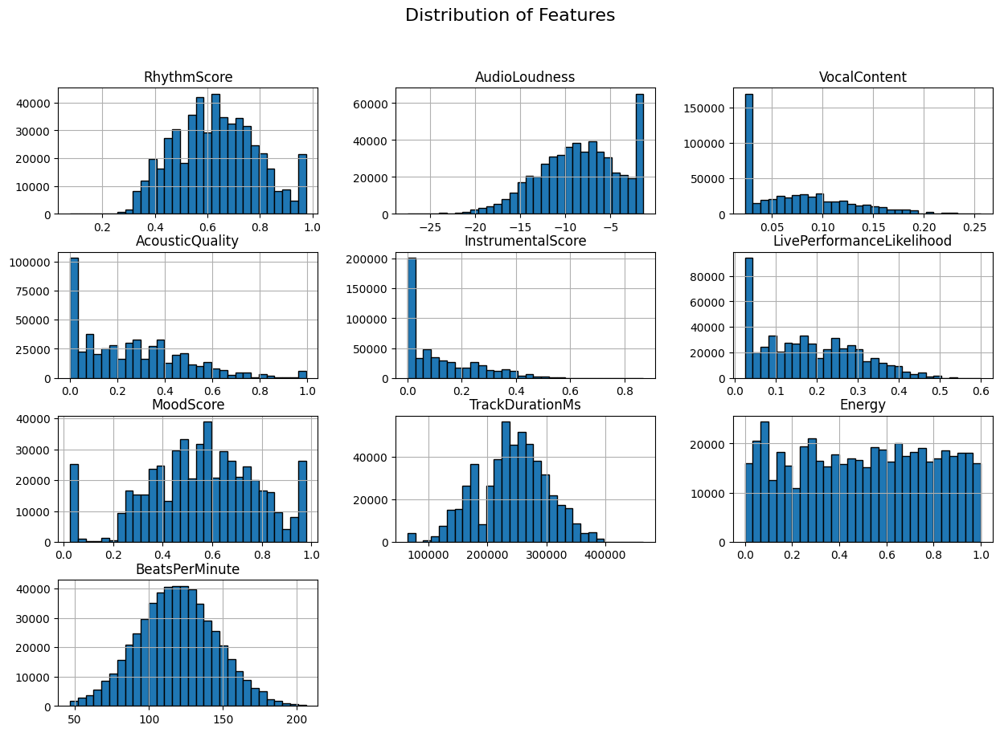

In [16]:
numeric_cols = ['RhythmScore','AudioLoudness','VocalContent','AcousticQuality',
                'InstrumentalScore','LivePerformanceLikelihood','MoodScore',
                'TrackDurationMs','Energy','BeatsPerMinute']

train[numeric_cols].hist(figsize=(15, 10), bins=30, edgecolor='black')
plt.suptitle("Distribution of Features", fontsize=16)
plt.show()

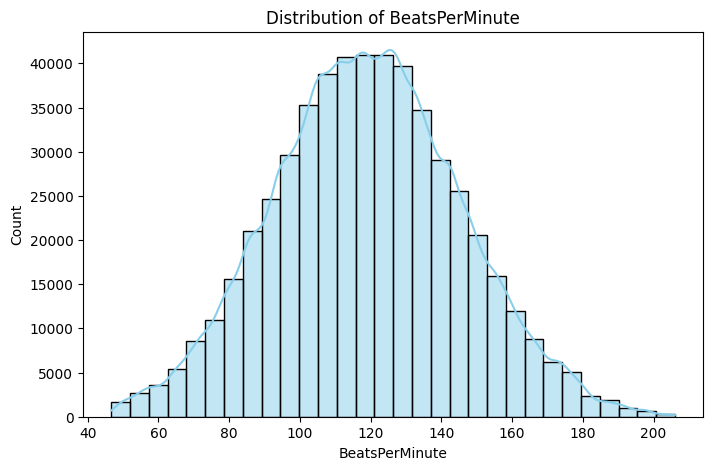

In [17]:
plt.figure(figsize=(8,5))
sns.histplot(train['BeatsPerMinute'], kde=True, bins=30, color="skyblue")
plt.title("Distribution of BeatsPerMinute")
plt.xlabel("BeatsPerMinute")
plt.ylabel("Count")
plt.show()

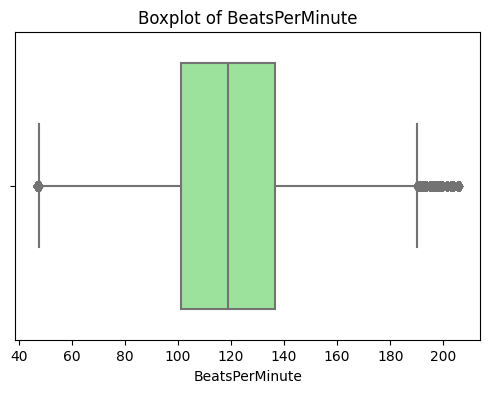

In [18]:
plt.figure(figsize=(6,4))
sns.boxplot(x=train['BeatsPerMinute'], color="lightgreen")
plt.title("Boxplot of BeatsPerMinute")
plt.show()

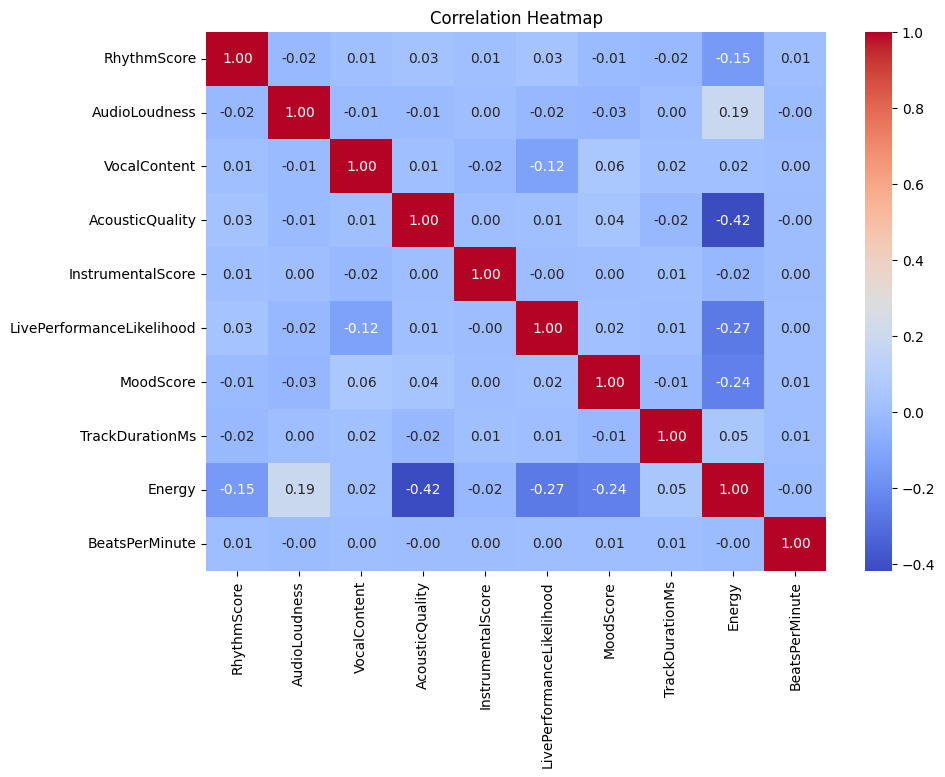

In [19]:
plt.figure(figsize=(10,7))
corr = train[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap")
plt.show()

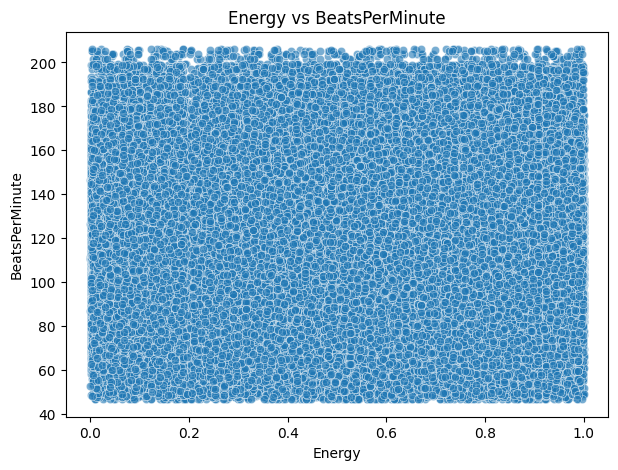

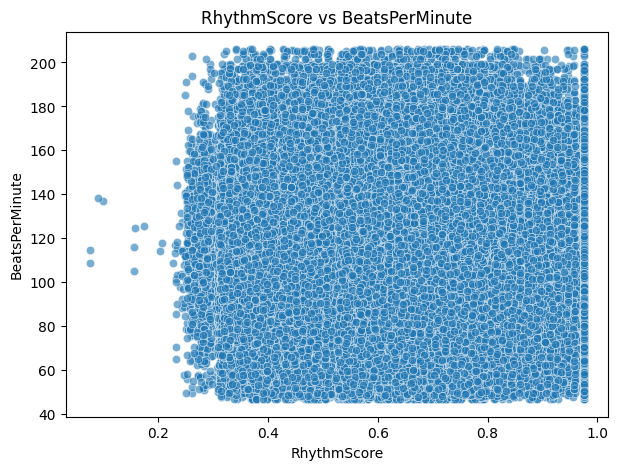

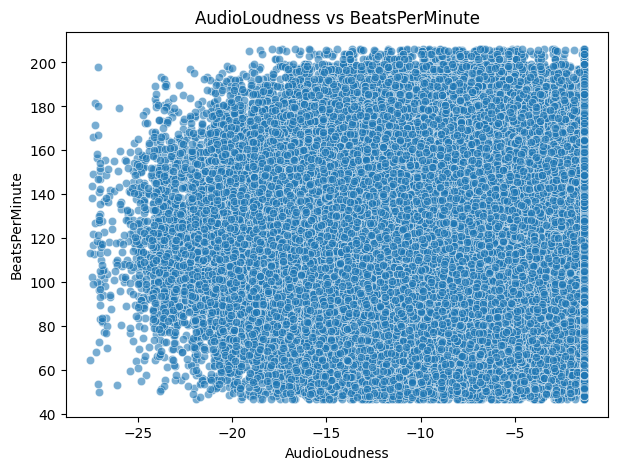

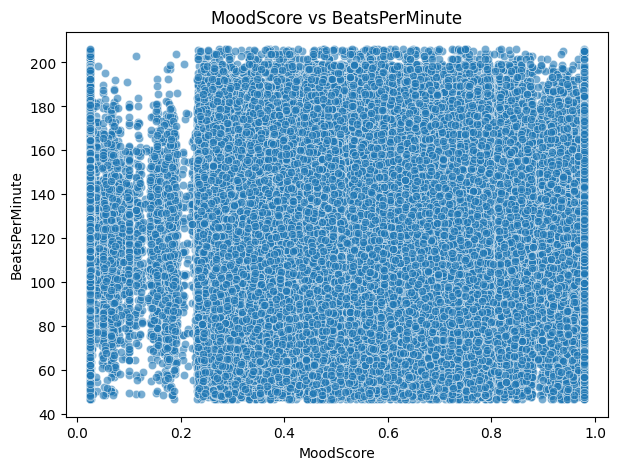

In [20]:
features = ['Energy','RhythmScore','AudioLoudness','MoodScore']
for col in features:
    plt.figure(figsize=(7,5))
    sns.scatterplot(x=train[col], y=train['BeatsPerMinute'], alpha=0.6)
    plt.title(f"{col} vs BeatsPerMinute")
    plt.show()

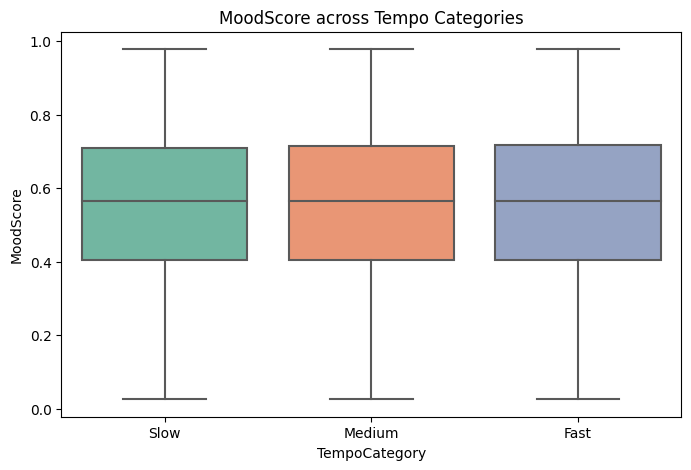

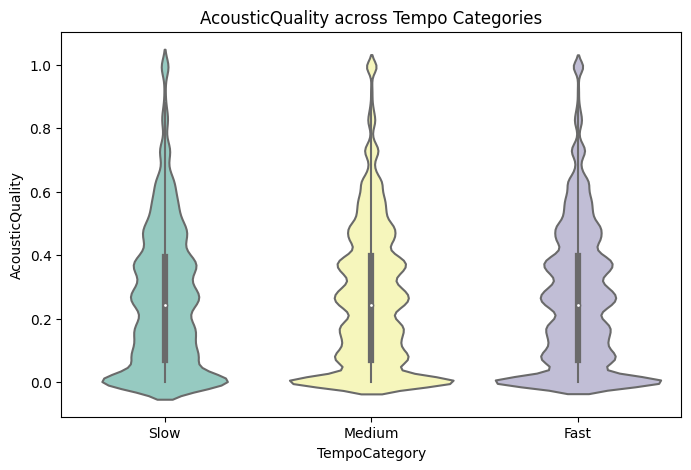

In [21]:
train['TempoCategory'] = pd.cut(train['BeatsPerMinute'],
                             bins=[0,80,120,200],
                             labels=['Slow','Medium','Fast'])

plt.figure(figsize=(8,5))
sns.boxplot(x='TempoCategory', y='MoodScore', data=train, palette="Set2")
plt.title("MoodScore across Tempo Categories")
plt.show()

plt.figure(figsize=(8,5))
sns.violinplot(x='TempoCategory', y='AcousticQuality', data=train, palette="Set3")
plt.title("AcousticQuality across Tempo Categories")
plt.show()

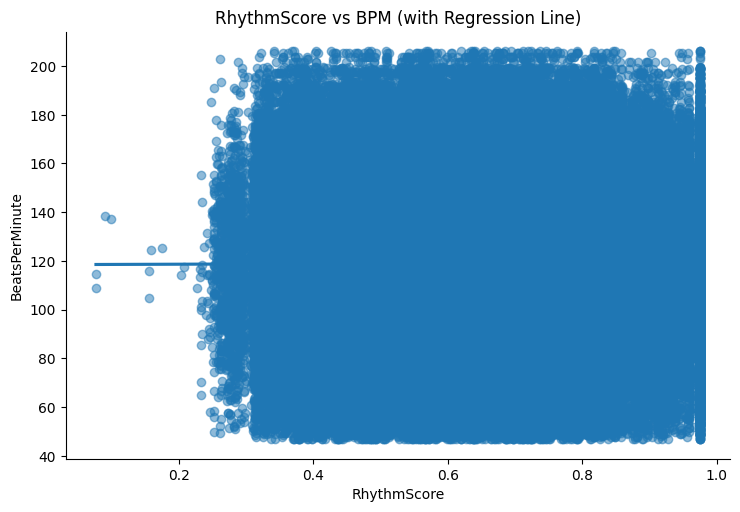

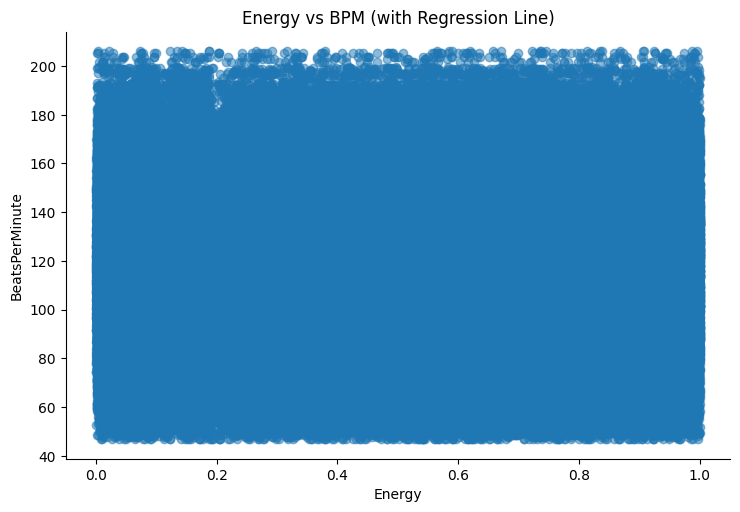

In [22]:
sns.lmplot(x="RhythmScore", y="BeatsPerMinute", data=train, aspect=1.5, scatter_kws={'alpha':0.5})
plt.title("RhythmScore vs BPM (with Regression Line)")
plt.show()

sns.lmplot(x="Energy", y="BeatsPerMinute", data=train, aspect=1.5, scatter_kws={'alpha':0.5})
plt.title("Energy vs BPM (with Regression Line)")
plt.show()

## Test visualizations

In [23]:
test.columns

Index(['id', 'RhythmScore', 'AudioLoudness', 'VocalContent', 'AcousticQuality',
       'InstrumentalScore', 'LivePerformanceLikelihood', 'MoodScore',
       'TrackDurationMs', 'Energy'],
      dtype='object')

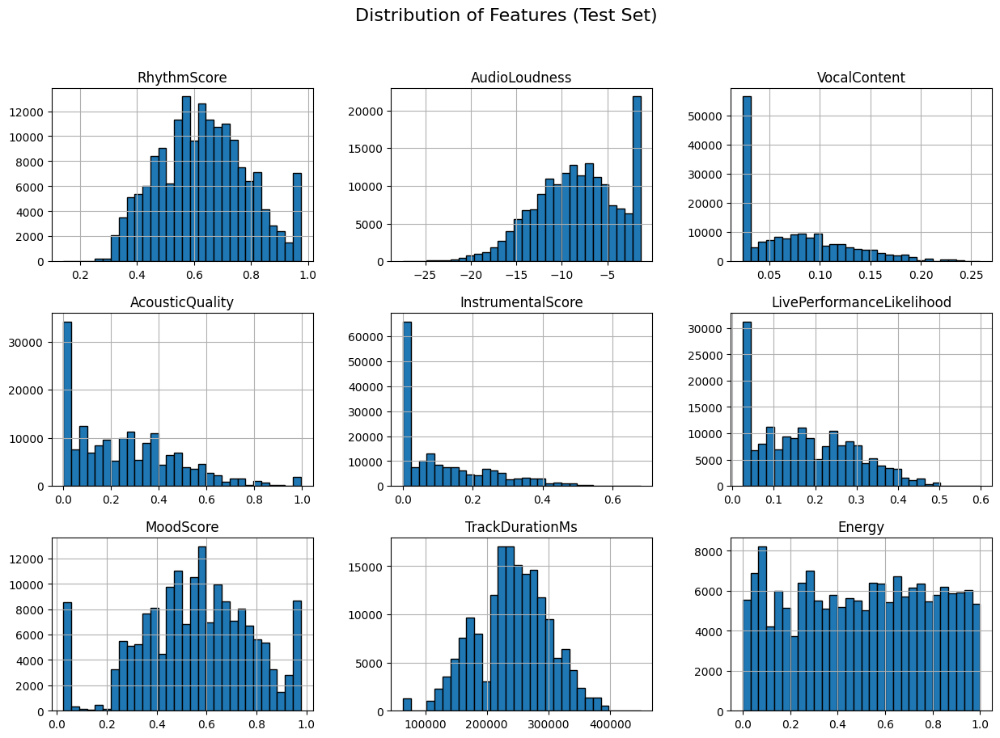

In [24]:
numeric_cols = ['RhythmScore','AudioLoudness','VocalContent','AcousticQuality',
                'InstrumentalScore','LivePerformanceLikelihood','MoodScore',
                'TrackDurationMs','Energy']

test[numeric_cols].hist(figsize=(15, 10), bins=30, edgecolor='black')
plt.suptitle("Distribution of Features (Test Set)", fontsize=16)
plt.show()


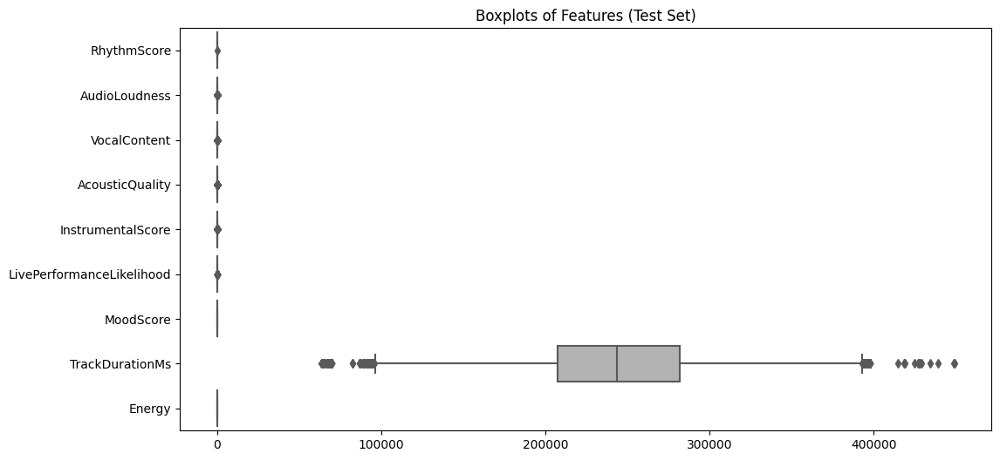

In [25]:
plt.figure(figsize=(12,6))
sns.boxplot(data=test[numeric_cols], orient="h", palette="Set2")
plt.title("Boxplots of Features (Test Set)")
plt.show()


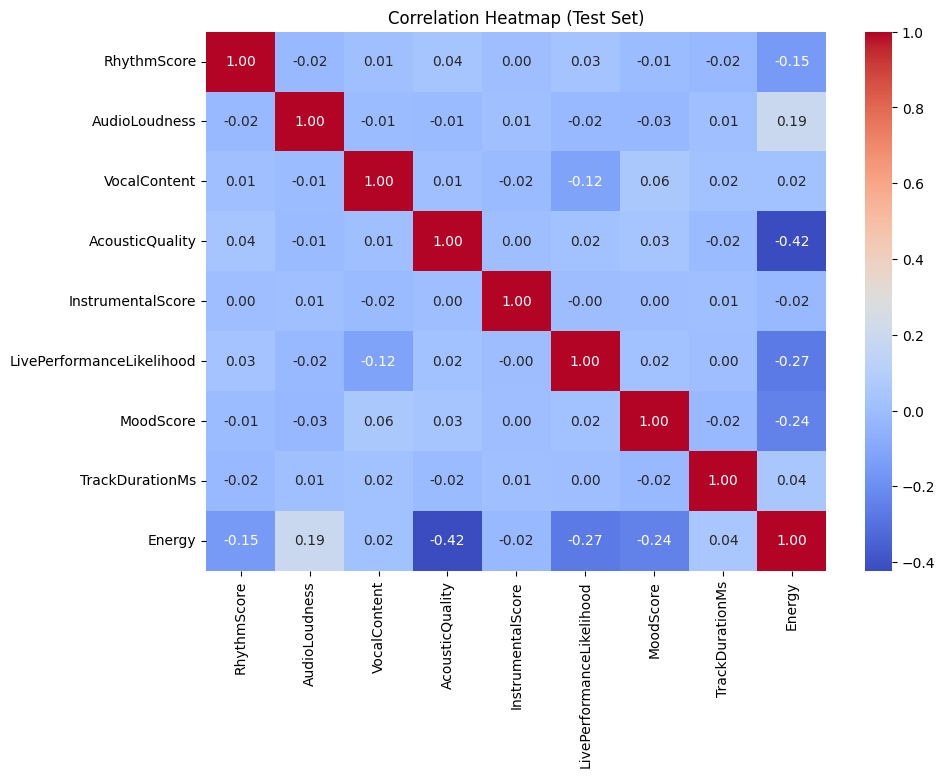

In [26]:
plt.figure(figsize=(10,7))
corr = test[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap (Test Set)")
plt.show()


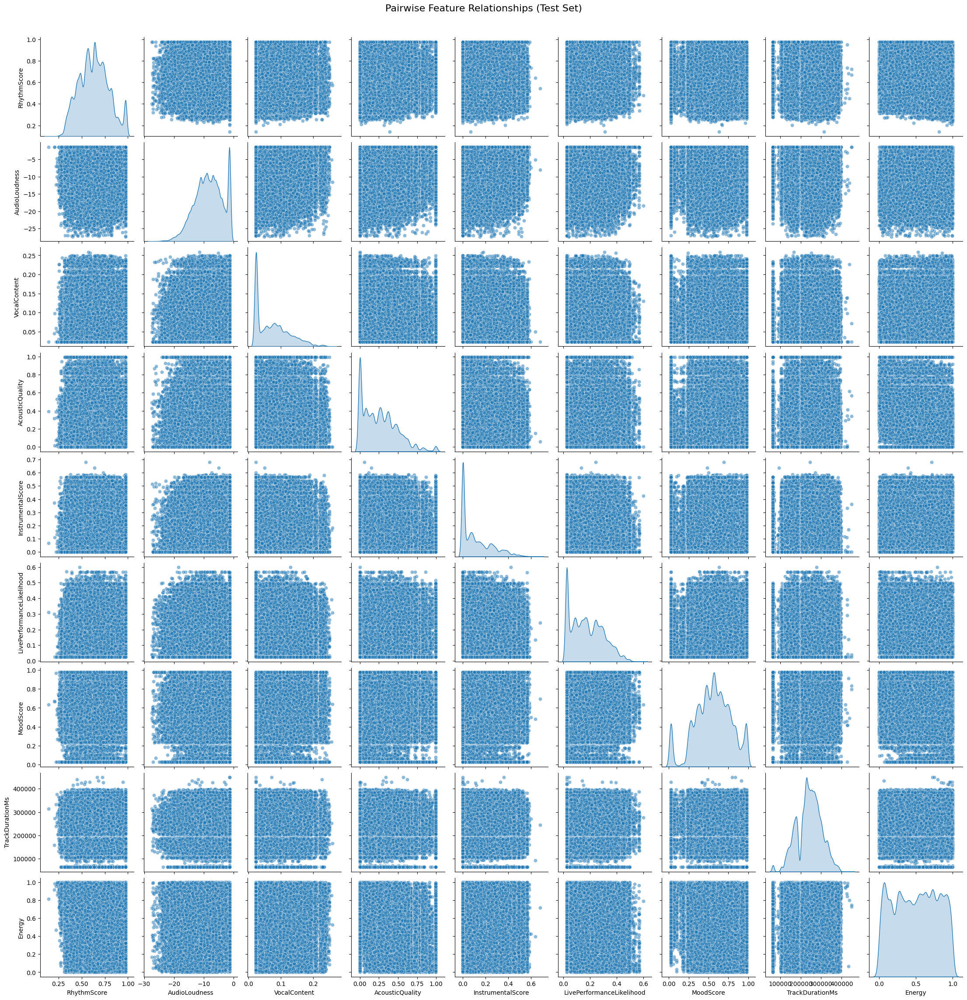

In [27]:
sns.pairplot(test[numeric_cols], diag_kind="kde", plot_kws={'alpha':0.5})
plt.suptitle("Pairwise Feature Relationships (Test Set)", y=1.02, fontsize=16)
plt.show()

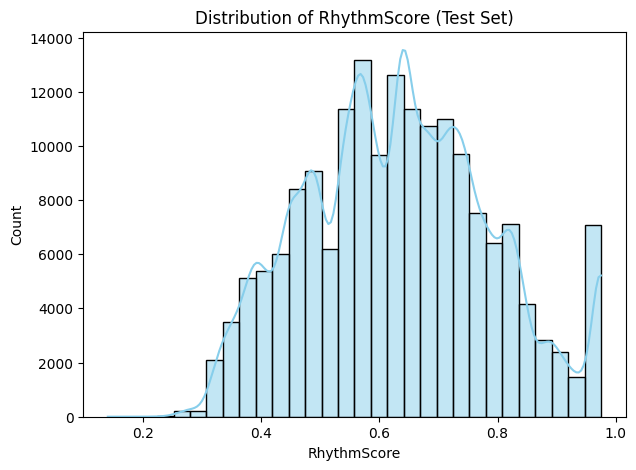

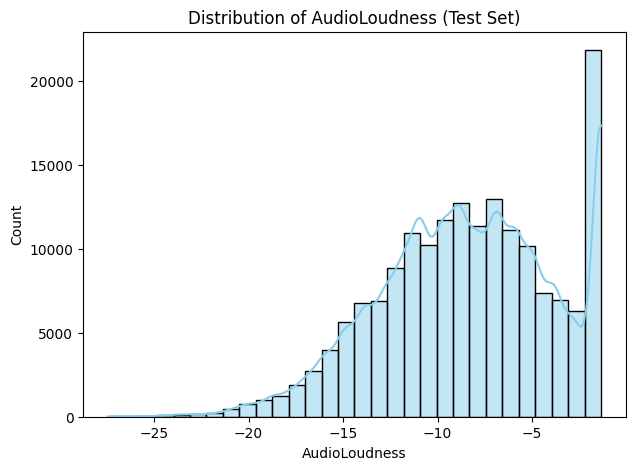

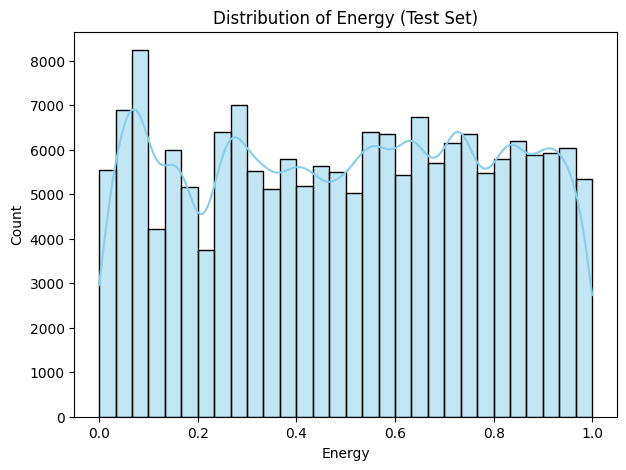

In [28]:
for col in ['RhythmScore','AudioLoudness','Energy']:
    plt.figure(figsize=(7,5))
    sns.histplot(test[col], kde=True, bins=30, color="skyblue")
    plt.title(f"Distribution of {col} (Test Set)")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()


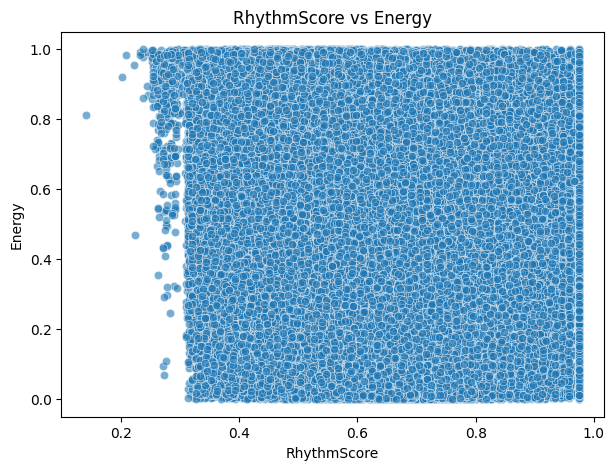

In [29]:
plt.figure(figsize=(7,5))
sns.scatterplot(x=test['RhythmScore'], y=test['Energy'], alpha=0.6)
plt.title("RhythmScore vs Energy")
plt.show()


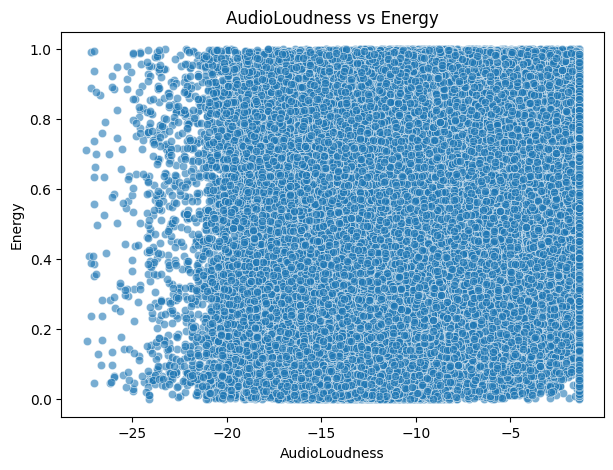

In [30]:
plt.figure(figsize=(7,5))
sns.scatterplot(x=test['AudioLoudness'], y=test['Energy'], alpha=0.6)
plt.title("AudioLoudness vs Energy")
plt.show()


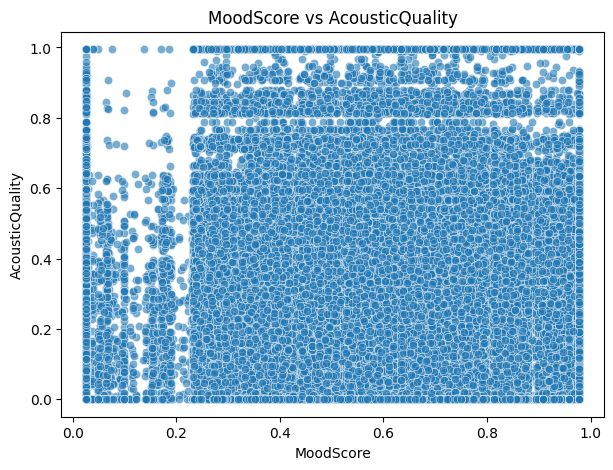

In [31]:
plt.figure(figsize=(7,5))
sns.scatterplot(x=test['MoodScore'], y=test['AcousticQuality'], alpha=0.6)
plt.title("MoodScore vs AcousticQuality")
plt.show()

## ML Predictions

In [32]:
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)


In [33]:
# Cross-validation
N_FOLDS = 5
kf = KFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

In [34]:
oof_preds = np.zeros((len(X), 3))  # for stacking
test_preds = np.zeros((len(X_test), 3))

In [35]:
lgb_params = {
    "objective": "regression",
    "metric": "rmse",
    "learning_rate": 0.01,
    "num_leaves": 64,        # tuned
    "feature_fraction": 0.85,
    "bagging_fraction": 0.85,
    "bagging_freq": 5,
    "lambda_l2": 2.0,        # tuned regularization
    "random_state": 42,
}

In [36]:
for fold, (trn_idx, val_idx) in enumerate(kf.split(X)):
    X_train, y_train = X.iloc[trn_idx], y.iloc[trn_idx]
    X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]

    train_data = lgb.Dataset(X_train, label=y_train)
    valid_data = lgb.Dataset(X_val, label=y_val)

    model = lgb.train(
        lgb_params,
        train_data,
        valid_sets=[valid_data],
        num_boost_round=20000,
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(1000)]
    )

    oof_preds[val_idx, 0] = model.predict(X_val, num_iteration=model.best_iteration)
    test_preds[:, 0] += model.predict(X_test, num_iteration=model.best_iteration) / N_FOLDS

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 419331, number of used features: 9
[LightGBM] [Info] Start training from score 119.056554
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[188]	valid_0's rmse: 26.4378
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 419331, number of used features: 9
[LightGBM] [Info] Start training from score 119.039042
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[185]	valid_0's rmse: 26.4826
[LightGBM] [Info] Auto-choosing col-wise multi-threading, 

## XGB

In [37]:
xgb_params = {
    "objective": "reg:squarederror",
    "eval_metric": "rmse",
    "learning_rate": 0.01,
    "max_depth": 7,
    "subsample": 0.85,
    "colsample_bytree": 0.85,
    "lambda": 2.0,
    "random_state": 42,
}

In [38]:
for fold, (trn_idx, val_idx) in enumerate(kf.split(X)):
    X_train, y_train = X.iloc[trn_idx], y.iloc[trn_idx]
    X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dval = xgb.DMatrix(X_val, label=y_val)
    dtest = xgb.DMatrix(X_test)

    model = xgb.train(
        xgb_params,
        dtrain,
        num_boost_round=20000,
        evals=[(dval, "valid")],
        early_stopping_rounds=200,
        verbose_eval=1000
    )

    oof_preds[val_idx, 1] = model.predict(xgb.DMatrix(X_val), iteration_range=(0, model.best_iteration))
    test_preds[:, 1] += model.predict(dtest, iteration_range=(0, model.best_iteration)) / N_FOLDS

[0]	valid-rmse:26.44516
[326]	valid-rmse:26.44245
[0]	valid-rmse:26.49241
[334]	valid-rmse:26.48719
[0]	valid-rmse:26.53192
[333]	valid-rmse:26.52735
[0]	valid-rmse:26.45407
[464]	valid-rmse:26.44681
[0]	valid-rmse:26.41572
[406]	valid-rmse:26.41255


## CAT Boost

In [39]:
cb_params = {
    "iterations": 20000,
    "learning_rate": 0.01,
    "depth": 7,
    "l2_leaf_reg": 5,  # tuned regularization
    "loss_function": "RMSE",
    "eval_metric": "RMSE",
    "random_seed": 42,
    "early_stopping_rounds": 200,
    "verbose": 1000,
}

In [40]:
for fold, (trn_idx, val_idx) in enumerate(kf.split(X)):
    X_train, y_train = X.iloc[trn_idx], y.iloc[trn_idx]
    X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]
    
    model = cb.CatBoostRegressor(**cb_params)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), use_best_model=True, verbose=0)
    
    oof_preds[val_idx, 2] = model.predict(X_val)
    test_preds[:, 2] += model.predict(X_test) / N_FOLDS

# === Meta-model (stacking with Ridge) ===
meta = Ridge(alpha=1.0)
meta.fit(oof_preds, y)

final_oof = meta.predict(oof_preds)
final_test = meta.predict(test_preds)

cv_score = mean_squared_error(y, final_oof, squared=False)
print(f"OOF CV RMSE (stacked): {cv_score:.5f}")

OOF CV RMSE (stacked): 26.45886


In [41]:
sample_sub["BeatsPerMinute"] = final_test
sample_sub.to_csv("submission.csv", index=False)
print("Submission saved!")

Submission saved!


## Thank you..pls upvote!!!